In [1]:
%matplotlib inline

#system
import os
import glob

#math
import numpy as np

#video and image
import cv2
import moviepy
from moviepy.editor import VideoFileClip

#display
import matplotlib.pyplot as plt
import matplotlib.image as mplimg
from matplotlib.patches import Polygon
from IPython.display import HTML


# Camera Calibration

In [2]:
class CameraCalibration(object):
    '''
    class containing camera calibration constants and perspective transform matrices
    '''
    def __init__(self, 
                 filepaths, 
                 chessboard_dim=(9, 6),
                 src=None,
                 dst=None):        
        # chessboard dimensions
        self.nx = chessboard_dim[0]
        self.ny = chessboard_dim[1]
        # camera image dimensions
        self.H = None
        self.W = None
        # list of filepaths of calibration images
        self.fpaths = filepaths
        # camera calibration coefficients
        self.iscalibrated, self.mtx, self.dist, self.rvecs, self.tvecs = self._calibrate_camera()
        
        # perspective transform points
        self.src = src
        self.dst = src
        if self.src is None or self.dst is None:
            self.src = np.float32([[574, 462], # top left
                                  [243, 684], # bottom left
                                  [1056, 679], # bottom right
                                  [704, 462]]) # top right
            offset = 250
            self.dst = np.float32([[offset, 100],      
                                  [offset, self.H],
                                  [self.W-offset, self.H],
                                  [self.W-offset, 100]])
        self.M = None
        self.Minv = None
        
    def _calibrate_camera(self):
        # Arrays to store object points and image points from all the images.
        objpoints = [] # 3d points in real world space
        imgpoints = [] # 2d points in image plane.

        # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
        objp = np.zeros((self.nx * self.ny,3), np.float32)
        objp[:,:2] = np.mgrid[0:self.nx, 0:self.ny].T.reshape(-1,2)

        # Step through the list and search for chessboard corners
        for fname in self.fpaths:
            #convert to gray
            img = cv2.imread(fname)
            gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            #..record image dimensions if none exists yet
            if self.H is None or self.W is None:
                self.H, self.W = gray.shape
            # Find the chessboard corners
            ret, corners = cv2.findChessboardCorners(gray, (self.nx, self.ny),None)
            # If found, add object points, image points
            if ret == True:
                objpoints.append(objp)
                imgpoints.append(corners)

        # get camera calibration constants
        return cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    
    def undistort_image(self, image):
        return cv2.undistort(image, self.mtx, self.dist, None, self.mtx)

    def calculate_warp_matrices(self, src=None, dst=None):
        if src is not None and dst is not None:
            self.src = src
            self.dst = dst
        self.M = cv2.getPerspectiveTransform(self.src, self.dst)
        self.Minv = cv2.getPerspectiveTransform(self.dst, self.src)
        
    def warp_image(self, img):
        return cv2.warpPerspective(img, self.M, (self.W, self.H), flags=cv2.INTER_LINEAR)
    
    def unwarp_image(self, img):
        return cv2.warpPerspective(img, self.Minv, (self.W, self.H), flags=cv2.INTER_LINEAR)        
    

## Perfom calibration

In [3]:
# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# create calibration instance
CC = CameraCalibration(images)

#check if calibrated
print(CC.iscalibrated)


1.1868973603423731


## Test extracted camera calibration coefficients on undistorting images

### 1. test on chessboard images

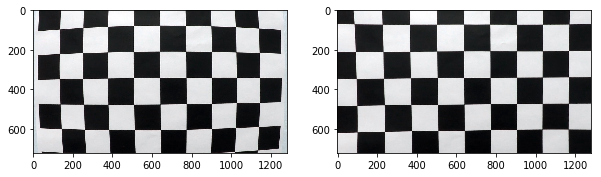

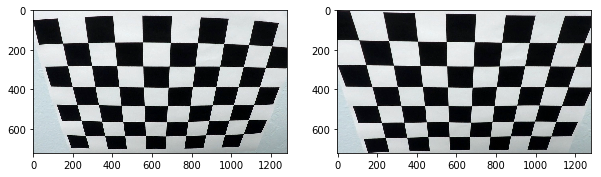

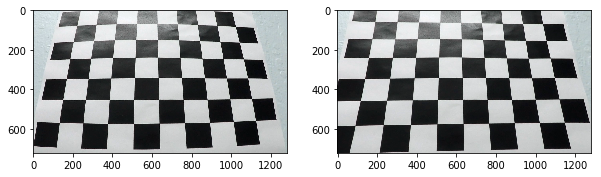

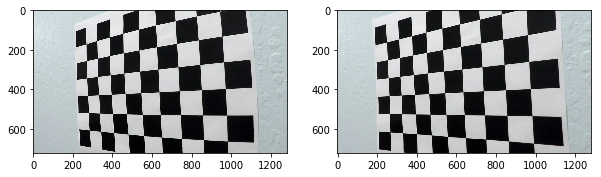

In [4]:
#test camera calibration
for i in range(1,5):
    calibration_img = cv2.imread('camera_cal/calibration{}.jpg'.format(i))
    undistorted_img = CC.undistort_image(calibration_img)
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,20))
    ax1.imshow(calibration_img)
    ax2.imshow(undistorted_img)

### 2. test on single frame extracted from video

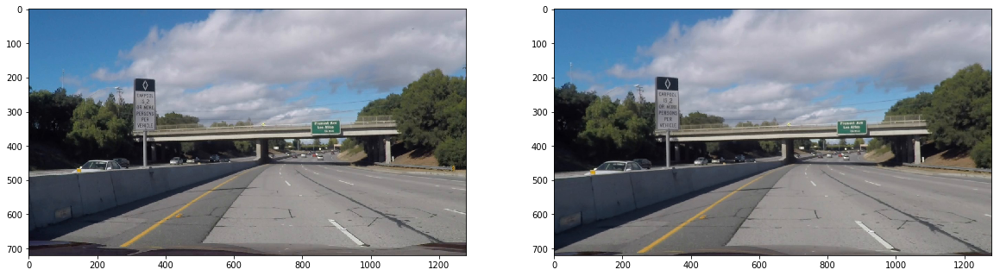

In [5]:
calibration_img = mplimg.imread('test_images/test_images_challenge/challenge_2.jpg')
undistorted_img = CC.undistort_image(calibration_img)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(calibration_img)
ax2.imshow(undistorted_img)

### 2. Setup warping parameters

In [6]:
# Warp constants
src = np.float32([[574, 462], # top left
                  [243, 684], # bottom left
                  [1056, 679], # bottom right
                  [704, 462]]) # top right
offset = 350
dst = np.float32([[offset, 100],      
                  [offset, CC.H],
                  [CC.W-offset, CC.H],
                  [CC.W-offset, 100]])

# Input warp constants to camera calibration instance to calculate 
# warp matrices
CC.calculate_warp_matrices(src, dst)


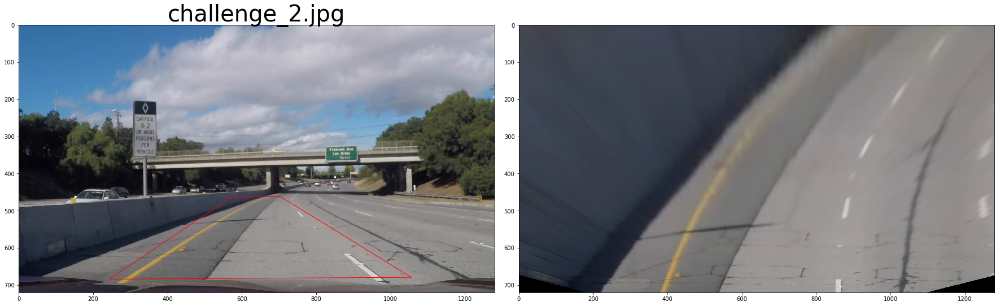

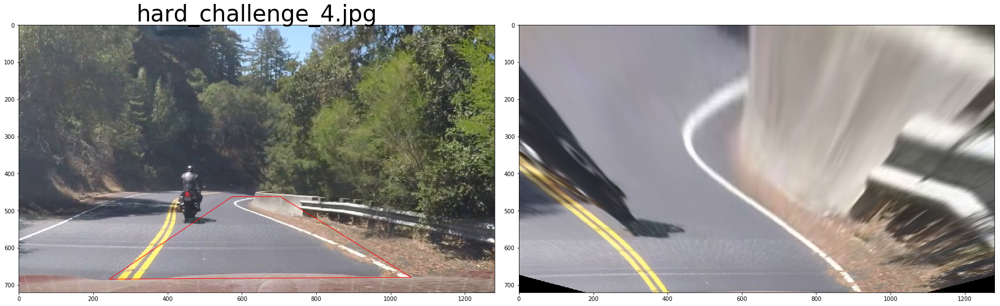

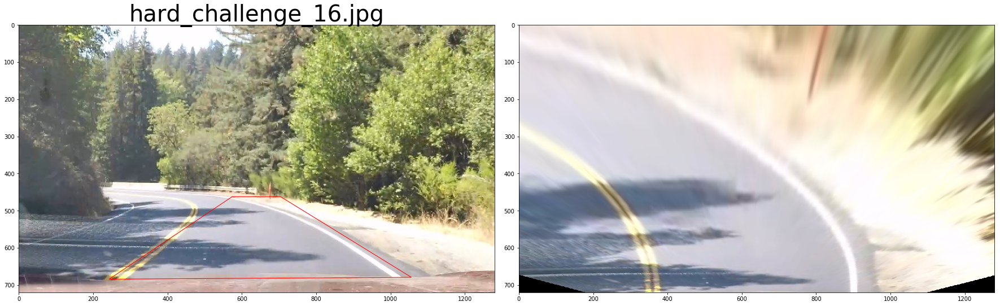

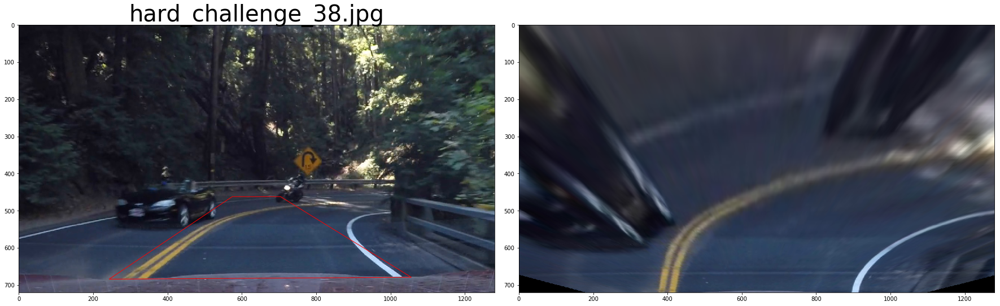

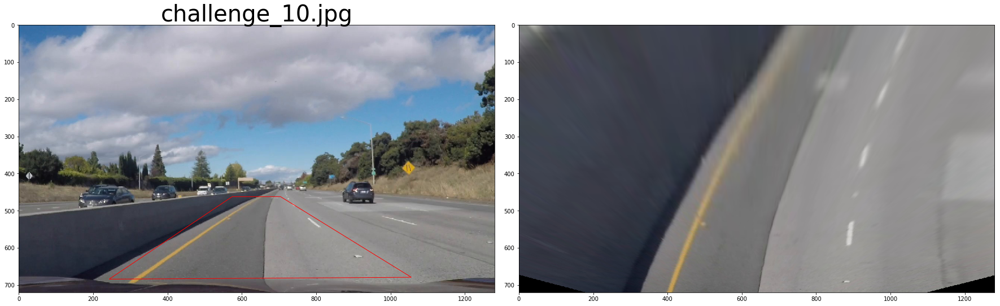

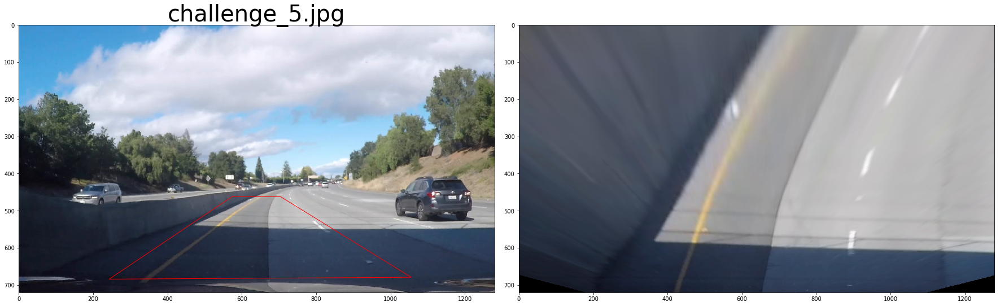

In [7]:
x_pts, y_pts = zip(*src)
root = 'test_images/test_images_challenge/'
for fname in os.listdir(root):
    path = os.path.join(root, fname)
    #..skip folders
    if os.path.isdir(path):
        continue
    
    # PIPELINE
    image = mplimg.imread(path)
    undist = CC.undistort_image(image)
    warped = CC.warp_image(undist)

    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(image)
    ax1.add_patch(Polygon(CC.src, fill=False, edgecolor='r'))
    ax1.set_title(fname, fontsize=40)

    ax2.imshow(warped)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Building the pipeline

### helper function for displaying images

In [8]:
# Helper function for visualizing pipeline
def display_pipe(img_dict, fontsize=30):
    n = len(img_dict)
    f, ax = plt.subplots(1, n, figsize=(24,9))
    f.tight_layout()
    for i in range(n):
        ax[i].imshow(img_dict[i]['image'], cmap='gray')
        ax[i].set_title(img_dict[i]['title'], fontsize=fontsize)
    return f, ax


## Image -> binary image -> warped binary image

In [9]:
def convert_to_binary(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
    img = np.copy(img)
    
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255
    
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(sxbinary == 1) | (s_binary == 1)] = 1
    
    return combined_binary


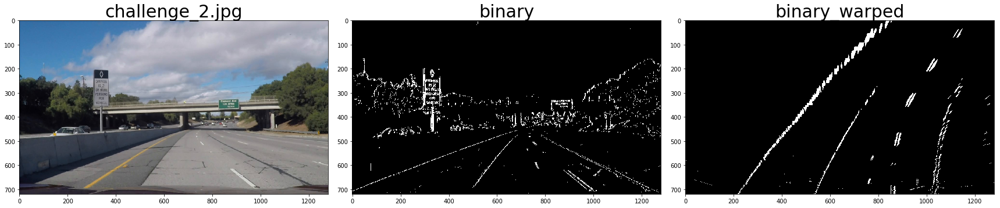

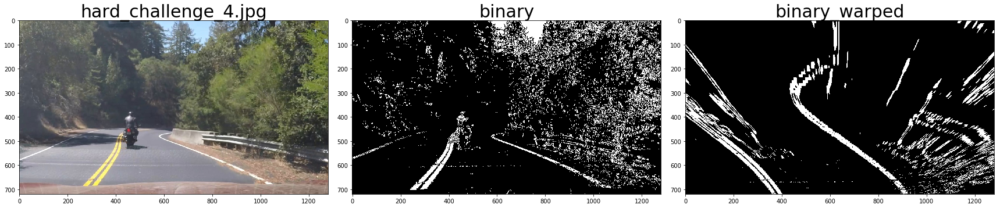

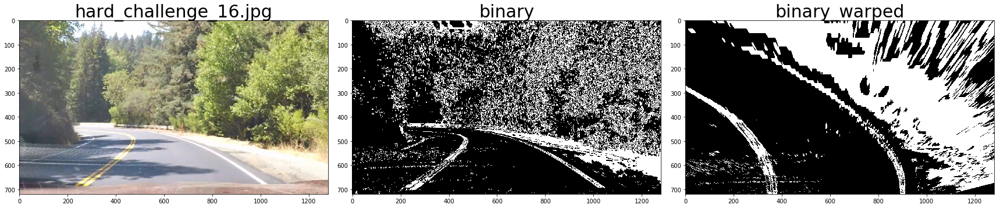

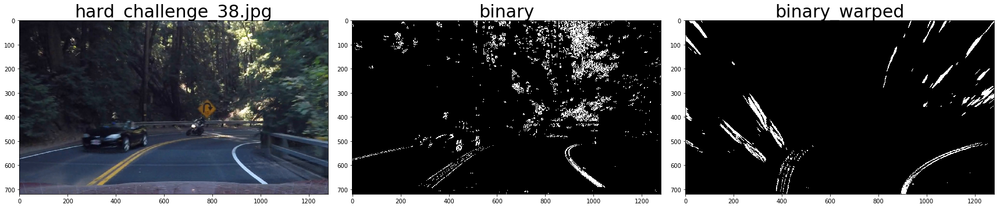

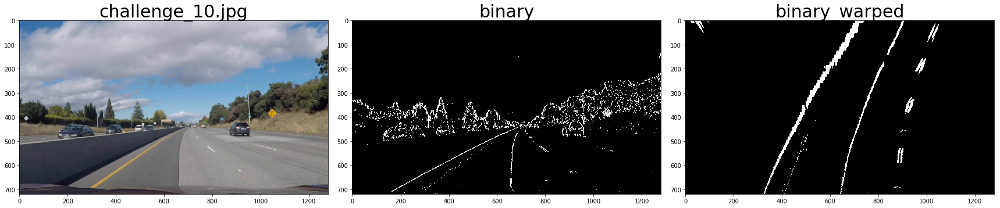

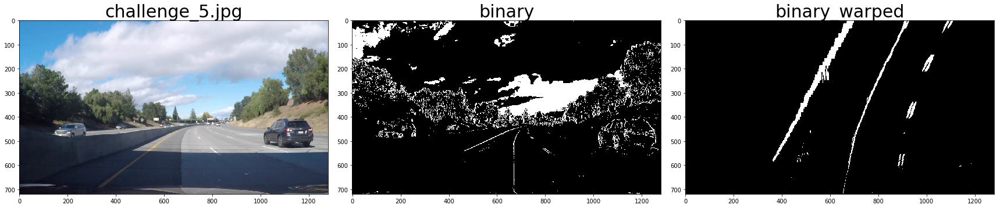

In [10]:
root = 'test_images/test_images_challenge/'
for fname in os.listdir(root):
    path = os.path.join(root, fname)
    #..skip folders
    if os.path.isdir(path):
        continue
    image = mplimg.imread(path)
    
    # Pipeline
    undist = CC.undistort_image(image)
    binary = convert_to_binary(undist)
    binary_warped = CC.warp_image(binary)
    
    # Plot the results
    img_dict = {0: {'title': fname, 'image': image},
                1: {'title': 'binary', 'image': binary},
                2: {'title': 'binary_warped', 'image': binary_warped}}
    display_pipe(img_dict)


## 2. Extract lines -> Make polynomial fit -> Get radius of curvature

In [11]:
class LaneLine(object):
    '''class that holds data describing a line extracted from a binary warped image'''
    def __init__(self):
        self.x = None
        self.y = None
        self.fit = None
        self.x_current = None
        self.lane_inds = []
        self.R = None
        self.dist_to_camera = None
        
    def compute_fit(self, deg=2):
        self.fit = np.polyfit(self.y, self.x, deg)
        
    def compute_R(self, xm_per_pix, ym_per_pix, y_eval):
        '''
        xm_per_pix = meters per pix in x
        ym_per_pix = meters per pix in y
        y_eval = y position in meters
        '''
        fit_cr = np.polyfit(self.y * ym_per_pix, self.x * xm_per_pix, 2)
        self.R = ((1+(2*fit_cr[0]*y_eval+fit_cr[1])**2)**1.5)/(np.abs(2*fit_cr[0]))
                
def extract_lanes(binary_warped, left=None, right=None, process_video=False):
    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 8
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Radius lower limit
    rlimit = 200
    
    #initialize variables
    H, W = binary_warped.shape
    if left is None:
        left = LaneLine()
    if right is None:
        right = LaneLine()
    
    # Set height of windows - based on nwindows above and image shape
    win_h = np.int(binary_warped.shape[0]//nwindows)
    # window starting points
    divs = np.linspace(H, 0, nwindows).astype(int)

    # Identify the x and y positions of all nonzero (i.e. activated) pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    # Current positions to be updated later for each window in nwindows\
    histogram = np.sum(binary_warped[H//2:, :], axis=0)
    midpoint = len(histogram)//2
    left.x_current = np.argmax(histogram[:midpoint]).astype(int)
    right.x_current = np.argmax(histogram[midpoint:]).astype(int) + midpoint
    
    # Create empty lists to receive left and right lane pixel indices
    left.lane_inds = []
    right.lane_inds = []

    out_img = np.dstack([binary_warped * 255] * 3)

    # If there are no previous results, 
    # or not processing a video, 
    # or line curvature dips below threshold, 
    # then perform windowed search.
    # Else, use previous line fit (plus minus margin) to speed up search
    if (not process_video or 
        (left.fit is None or right.fit is None) or
        (left.R < rlimit or right.R < rlimit) or
        (np.isnan(left.R) or np.isnan(right.R))
       ):
        
        # windowed search
        for d in divs[:-1]:
            for lane in [left, right]:
                #window coordinates
                win_y_low = d - win_h
                win_y_high = d 
                win_x_low = lane.x_current - margin  
                win_x_high = lane.x_current + margin  

                # Draw the windows on the visualization image
                cv2.rectangle(out_img,(win_x_low,win_y_low),
                (win_x_high,win_y_high),(0,255,0), 2) 

                # Extract indices of nonzero pixels falling inside window
                good_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &
                             (nonzerox >= win_x_low) & (nonzerox < win_x_high)).nonzero()[0]
                lane.lane_inds.append(good_inds)

                # Update window centers
                if np.sum(good_inds) > minpix:
                    lane.x_current = int(np.mean(nonzerox[good_inds]))
        # Concatenate the arrays of indices (previously was a list of lists of pixels)
        try:
            left_lane_inds = np.concatenate(left.lane_inds)
            right_lane_inds = np.concatenate(right.lane_inds)
        except ValueError:
            # Avoids an error if the above is not implemented fully
            pass
    else:
        # search around previous line 
        left_lane_inds = ((left.fit[0]*nonzeroy**2 + left.fit[1]*nonzeroy + left.fit[2] - margin < nonzerox) &
                          (left.fit[0]*nonzeroy**2 + left.fit[1]*nonzeroy + left.fit[2] + margin > nonzerox)).nonzero()[0]
        right_lane_inds = ((right.fit[0]*nonzeroy**2 + right.fit[1]*nonzeroy + right.fit[2] - margin < nonzerox) &
                          (right.fit[0]*nonzeroy**2 + right.fit[1]*nonzeroy + right.fit[2] + margin > nonzerox)).nonzero()[0]


    # Extract left and right line pixel positions
    left.x = nonzerox[left_lane_inds]
    left.y = nonzeroy[left_lane_inds] 
    right.x = nonzerox[right_lane_inds]
    right.y = nonzeroy[right_lane_inds]
    
    # Calculate polynomial fit coefficients
    left.compute_fit()
    right.compute_fit()
    
    # extract fit
    ploty = np.arange(image.shape[0])
    left_fitx = left.fit[0]*ploty**2 + left.fit[1]*ploty + left.fit[2]
    right_fitx = right.fit[0]*ploty**2 + right.fit[1]*ploty + right.fit[2]
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/np.mean(right_fitx - left_fitx) # average pixel distance between lines

    # Compute for distance from lane to car (in meters)
    midpoint = out_img.shape[1] // 2
    left.dist_to_camera = (midpoint - left_fitx[-1]) * xm_per_pix
    right.dist_to_camera = (right_fitx[-1] - midpoint) * xm_per_pix
    
    # Implement the calculation of R_curve (radius of curvature) 
    y_eval = np.max(ploty) * ym_per_pix
    left.compute_R(xm_per_pix, ym_per_pix, y_eval)
    right.compute_R(xm_per_pix, ym_per_pix, y_eval)

    return left, right, out_img
    

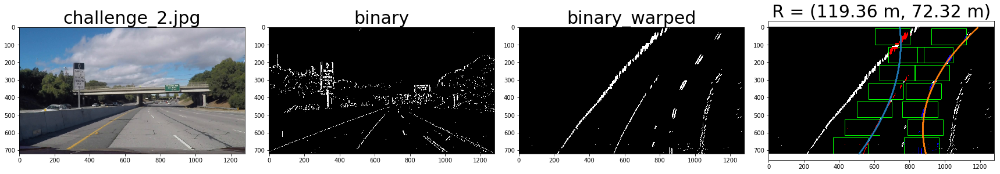

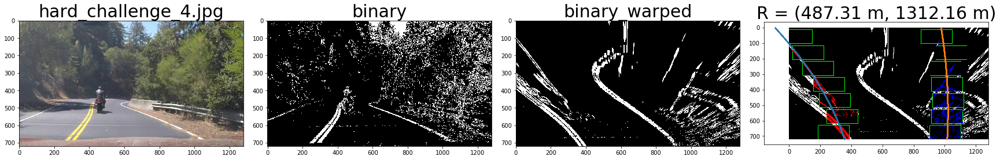

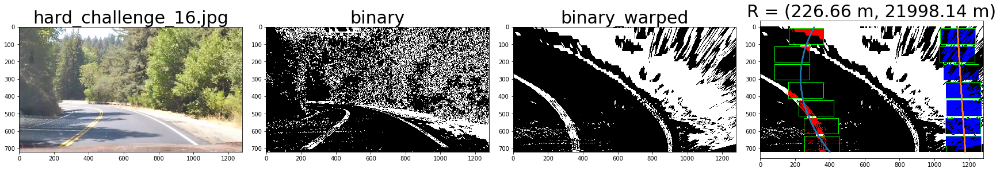

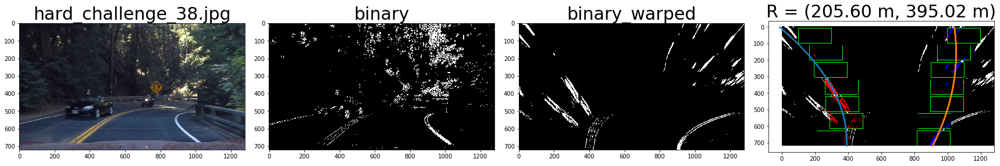

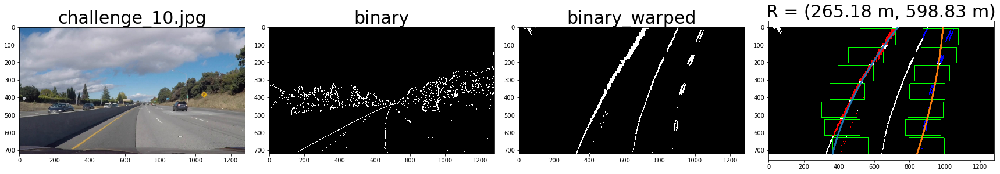

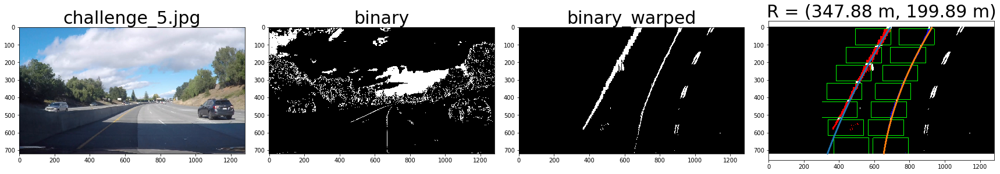

In [12]:
# image -> binary -> perspective transform -> extract lane pixels

root = 'test_images/test_images_challenge/'
for fname in os.listdir(root):
    path = os.path.join(root, fname)
    #..skip folders
    if os.path.isdir(path):
        continue
    image = mplimg.imread(path)
    
    # PIPELINE
    undist = CC.undistort_image(image)
    binary = convert_to_binary(undist)
    binary_warped = CC.warp_image(binary)    
    left, right, out_img = extract_lanes(binary_warped)

    # VISUALIZATION
    # mark lane pixels
    out_img[left.y, left.x] = [255, 0, 0]
    out_img[right.y, right.x] = [0, 0, 255]    

    # extract line fit
    ploty = np.arange(image.shape[0])
    left_fitx = left.fit[0]*ploty**2 + left.fit[1]*ploty + left.fit[2]
    right_fitx = right.fit[0]*ploty**2 + right.fit[1]*ploty + right.fit[2]

    # Plot the results
    img_dict = {0: {'title': fname, 'image': image},
                1: {'title': 'binary', 'image': binary},
                2: {'title': 'binary_warped', 'image': binary_warped},
                3: {'title': 'R = ({:.2f} m, {:.2f} m)'.format(left.R, right.R), 'image': out_img}
               }
    f, ax = display_pipe(img_dict)
    ax[3].scatter(left_fitx, ploty, s=1)
    ax[3].scatter(right_fitx, ploty, s=1)

## 3. Generate output images

In [13]:
def generate_overlay(left, right, img_size):
    H, W = img_size
    # Generate x and y values for plotting
    ploty = np.linspace(0, H-1, H)
    try:
        left_fitx = left.fit[0]*ploty**2 + left.fit[1]*ploty + left.fit[2]
        right_fitx = right.fit[0]*ploty**2 + right.fit[1]*ploty + right.fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    out_img = np.zeros((H, W, 3))
    # left line pixels are red, right line pixels are blue
    out_img[left.y, left.x] = [255, 0, 0]
    out_img[right.y, right.x] = [0, 0, 255]   

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(out_img, np.int_([pts]), (0, 255, 0))

    # Draw fitted lines
    color = [0, 255, 255]
    thickness = 5
    cv2.polylines(out_img, np.int_([pts_left]), False, color, thickness)
    cv2.polylines(out_img, np.int_([pts_right]), False, color, thickness)

    return out_img.astype(np.uint8)

def merge_overlay(overlay_warped, src_img, Minv, α=1, β=0.2, γ=0.):
    img_size = (src_img.shape[1], src_img.shape[0])
    overlay = cv2.warpPerspective(overlay_warped, Minv, img_size, flags=cv2.INTER_LINEAR)
    merged = cv2.addWeighted(src_img, α, overlay, β, γ)
    return merged
    
def annotate(img, left, right):
    thickness = 2
    scale = 1.5
    color = (255,255,255)
    cv2.putText(img, 
            'radius: [{:.2f}m, {:.2f}m]'.format(left.R, right.R),
            (10,100), cv2.FONT_HERSHEY_DUPLEX, 
            scale, color, thickness)
    deviation = left.dist_to_camera - right.dist_to_camera
    cv2.putText(img, 
            'deviation: {:.2f}m'.format(deviation),
            (10,150), cv2.FONT_HERSHEY_DUPLEX, 
            scale, color, thickness)
    return img

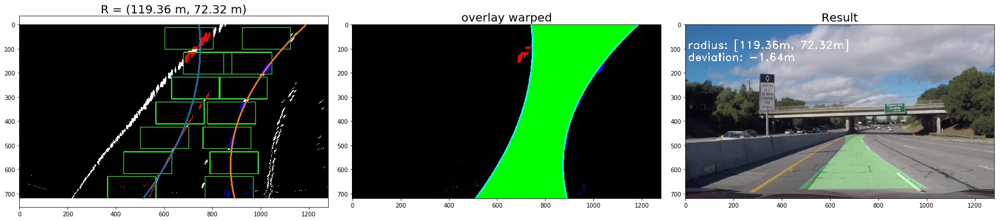

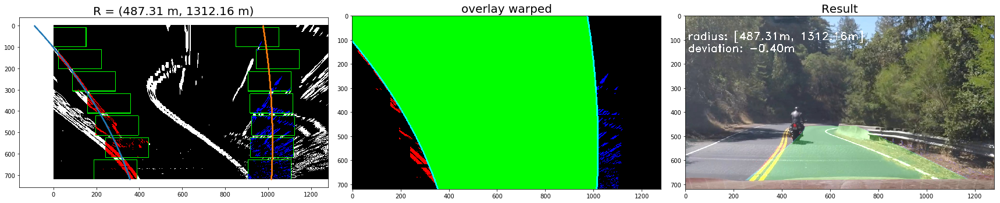

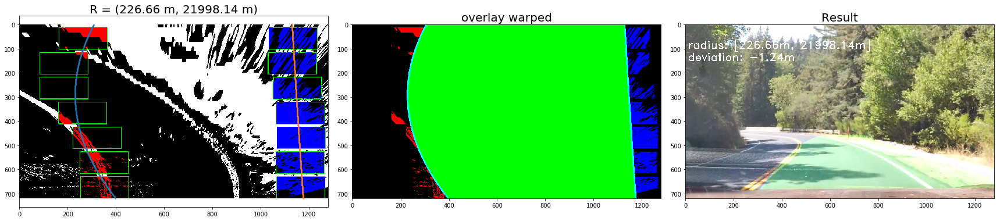

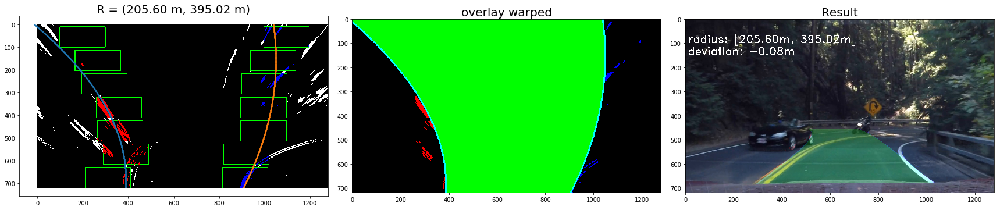

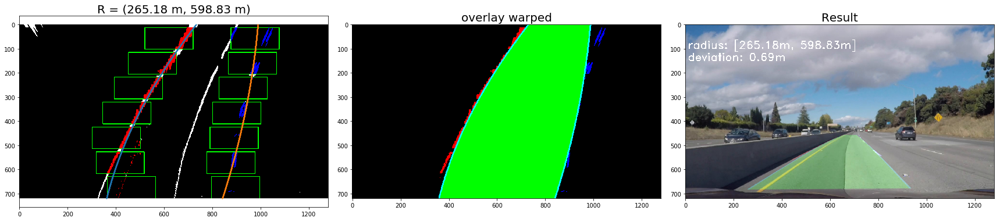

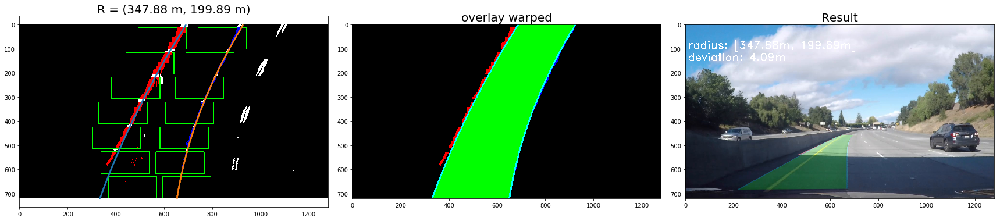

In [14]:
root = 'test_images/test_images_challenge/'
for fname in os.listdir(root):
    path = os.path.join(root, fname)
    #..skip folders
    if os.path.isdir(path):
        continue
    image = mplimg.imread(path)
    
    # PIPELINE
    undist = CC.undistort_image(image)
    binary = convert_to_binary(undist)
    binary_warped = CC.warp_image(binary)    
    left, right, out_img = extract_lanes(binary_warped)
    overlay_warped = generate_overlay(left, right, binary_warped.shape)
    merged = merge_overlay(overlay_warped, image, CC.Minv)
    result = annotate(merged, left, right)

    # VISUALIZATION
    # mark lane pixels
    out_img[left.y, left.x] = [255, 0, 0]
    out_img[right.y, right.x] = [0, 0, 255]    

    # extract line fit
    ploty = np.arange(image.shape[0])
    left_fitx = left.fit[0]*ploty**2 + left.fit[1]*ploty + left.fit[2]
    right_fitx = right.fit[0]*ploty**2 + right.fit[1]*ploty + right.fit[2]

    # Plot the results
    img_dict = {
                0: {'title': 'R = ({:.2f} m, {:.2f} m)'.format(left.R, right.R), 'image': out_img},
                1: {'title': 'overlay warped', 'image': overlay_warped},
                2: {'title': 'Result', 'image': result},
               }
    f, ax = display_pipe(img_dict, fontsize=20)
    ax[0].scatter(left_fitx, ploty, s=1)
    ax[0].scatter(right_fitx, ploty, s=1)

# Summary: Processing pipeline

1. Camera Calibration - Correct for distortion; Define warping parameters
2. Isolate lines by transforming RGB to binary image
3. Perform perspective transform to create "top view"
4. Create polynomial fit on left and right lanes and compute radius of curvature
6. Define lane region on warped image. Unwarp colored lane region. Merge unwarped lane region with original source image.  

In [15]:
class Pipeline(object):
    def __init__(self, images):
        self.CC = CameraCalibration(images)
        # Warp constants
        src = np.float32([[574, 462], # top left
                          [243, 684], # bottom left
                          [1056, 679], # bottom right
                          [704, 462]]) # top right
        offset = 250
        dst = np.float32([[offset, 100],      
                          [offset, CC.H],
                          [CC.W-offset, CC.H],
                          [CC.W-offset, 100]])

        self.CC.calculate_warp_matrices(src, dst)
        self.left, self.right = (LaneLine(), LaneLine())

    def execute(self, image):
        undist = self.CC.undistort_image(image)
        binary = convert_to_binary(undist)
        binary_warped = self.CC.warp_image(binary)    
        _, _, _ = extract_lanes(binary_warped, 
                               left=self.left, 
                               right=self.right, 
                               process_video=True)
        overlay_warped = generate_overlay(self.left, self.right, binary_warped.shape)
        merged = merge_overlay(overlay_warped, image, self.CC.Minv)
        result = annotate(merged, self.left, self.right)
        return result

## Initialize pipeline instance

In [16]:
#Perform initial calibration
images = glob.glob('camera_cal/calibration*.jpg')
pipe = Pipeline(images)

# Challenge videos

In [17]:
video_file_challenge = 'challenge_video.mp4'
output_video_challenge = 'output_videos/' + video_file_challenge

clip1 = VideoFileClip(video_file_challenge)
process_clip = clip1.fl_image(pipe.execute) 
%time process_clip.write_videofile(output_video_challenge, audio=False)

[MoviePy] >>>> Building video output_videos/challenge_video.mp4
[MoviePy] Writing video output_videos/challenge_video.mp4


100%|██████████| 485/485 [01:21<00:00,  5.99it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos/challenge_video.mp4 

CPU times: user 3min 39s, sys: 10.1 s, total: 3min 49s
Wall time: 1min 22s


In [18]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output_video_challenge))

In [19]:
video_file_challenge2 = 'harder_challenge_video.mp4'
output_video_challenge = 'output_videos/' + video_file_challenge2

clip1 = VideoFileClip(video_file_challenge2)
process_clip = clip1.fl_image(pipe.execute) 
%time process_clip.write_videofile(output_video_challenge, audio=False)

[MoviePy] >>>> Building video output_videos/harder_challenge_video.mp4
[MoviePy] Writing video output_videos/harder_challenge_video.mp4


100%|█████████▉| 1199/1200 [04:09<00:00,  4.11it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos/harder_challenge_video.mp4 

CPU times: user 10min, sys: 29.6 s, total: 10min 29s
Wall time: 4min 11s


In [20]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output_video_challenge))